In [1]:
from libraries import *
from parameters import *
import statsmodels.api as sm
import sklearn.feature_selection
import statsmodels.api as sm
import sklearn.feature_selection
from sklearn.preprocessing import PolynomialFeatures
import warnings
warnings.filterwarnings('ignore')
#from statannot import add_stat_annotation
from numpy.random import seed
from numpy.random import randint
import statsmodels.formula.api as smf

import statsmodels.api as sm
%load_ext rpy2.ipython

import sys
# setIndex_1=sys.argv[1]
# setIndex_2=sys.argv[2]
from sklearn.preprocessing import OneHotEncoder

In [2]:
os.getcwd()
os.chdir(projectDir)

In [4]:
adataC = sc.read('outputs/anndata/adata-hash-features_singlets_SingleKO_08122020_PerGENE.h5ad')


allGeneNames = pd.read_csv("./TextFiles/AllExpGeneNames.csv", index_col=0)

# adataC.obs["subCellType"] = "DC2"
# adataC.obs.loc[adataC.obs.leiden.isin(['3']), "subCellType"] = "MacDC"
# adataC.obs.loc[adataC.obs.leiden.isin(['8']), "subCellType"] = "DC1"
# adataC.obs.loc[adataC.obs.leiden.isin(['5']), "subCellType"] = "MReg"

In [6]:
cGenes = pd.read_csv('./TextFiles/ICA_15_factors_effectedGenes_paper.csv')
#cGenes = pd.read_csv('/home/beraslan/jovian-work/analysisSingle/ICA_15_factors_effectedGenes_paper_lowerThreshold.csv')

cGenes.columns = [x.replace(" ","") for x in cGenes.columns]
cGenes.columns = [x.replace("genegroup","_") for x in cGenes.columns]

In [7]:
cGenes

,Factor1_1,Factor1_2,Factor1guidegroup1,Factor1guidegroup2,Factor2_1,Factor2_2,Factor2guidegroup1,Factor2guidegroup2,Factor3_1,Factor3_2,...,Factor13guidegroup1,Factor13guidegroup2,Factor14_1,Factor14_2,Factor14guidegroup1,Factor14guidegroup2,Factor15_1,Factor15_2,Factor15guidegroup1,Factor15guidegroup2
0,Eef1a1,Ms4a7,Rack1,Ddx41,Ccr5,Mmp8,Wdr43,Btbd1,Stap1,Lgals1,...,Rack1,Smu1,Rps20,Mcub,Smu1,Traf2,Ybx1,Fcer1g,Rack1,Wdr43
1,Tpt1,Sgk1,Utp15,Plrg1,H3f3b,Thbs1,Map3k7,Upf1,X2010005H15Rik,Naaa,...,Wdr43,Cdc27,Chil3,C1qb,Nedd8,Wdr5,Rps27l,C1qb,Myc,Cul3
2,Rps27,Lhfpl2,Wdr43,Chd4,Tlr2,Acod1,Brca1,Tlr4,Pid1,Plet1,...,Rrp9,Skp1a,Gpx3,S100a11,Rbx1,Kdm5c,AC160336.1,C1qc,Taf5,Keap1
3,Rplp0,Il1rn,Raf1,Tab1,Sdc4,Slc7a11,Traf2,Nup43,Spata13,Creg1,...,Taf5,Ubr4,St8sia4,Fn1,Rela,Hira,Hsp90aa1,Aprt,Naca,Kdm5c
4,Eif3f,Alcam,Uhrf1,Zbtb25,Lmo4,Cxcl3,Ube2n,Wdr61,Trem1,Cd36,...,Naca,Cul1,Adgrl2,Hvcn1,Dpf2,Pias1,Chchd2,Cyba,Copa,Kat6a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,Ncl,,,,,,,,,,...,,,,,,,,,,
102,Ssr4,,,,,,,,,,...,,,,,,,,,,
103,Pabpc1,,,,,,,,,,...,,,,,,,,,,
104,Anxa2,,,,,,,,,,...,,,,,,,,,,


computing score 'Factor1_1'
    finished: added
    'Factor1_1', score of gene set (adata.obs).
    203 total control genes are used. (0:00:07)


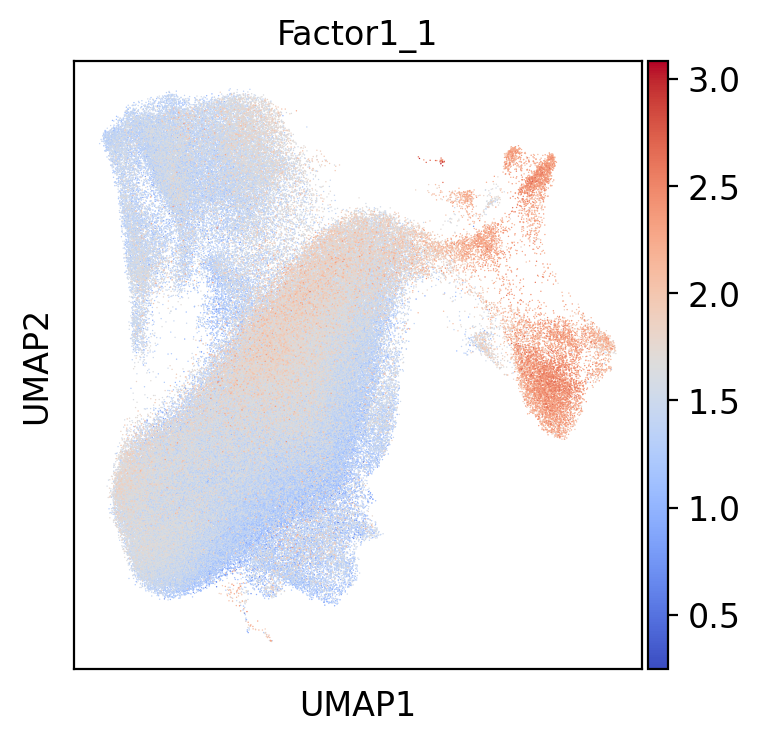

computing score 'Factor1_2'
    finished: added
    'Factor1_2', score of gene set (adata.obs).
    209 total control genes are used. (0:00:08)


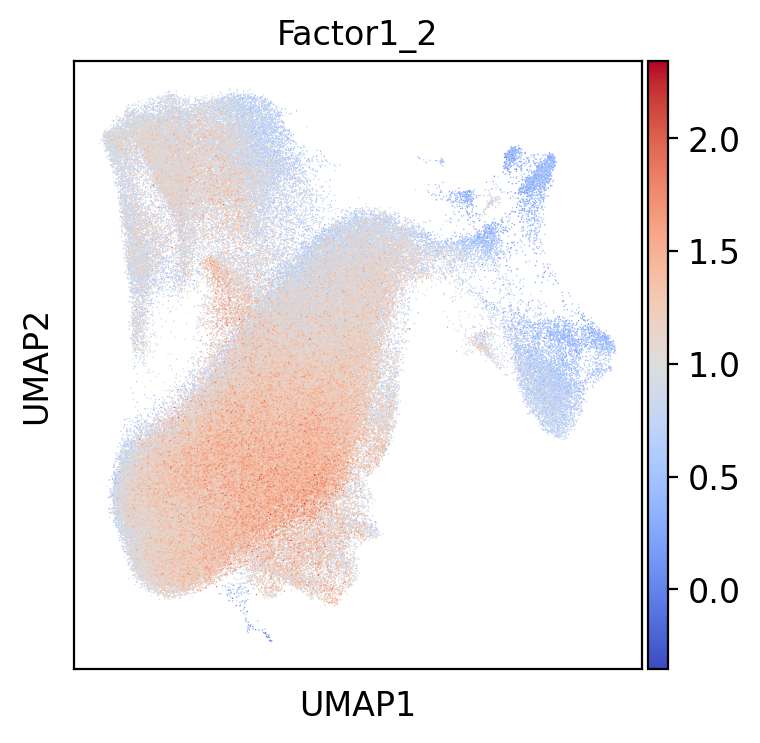

computing score 'Factor2_1'
    finished: added
    'Factor2_1', score of gene set (adata.obs).
    197 total control genes are used. (0:00:09)


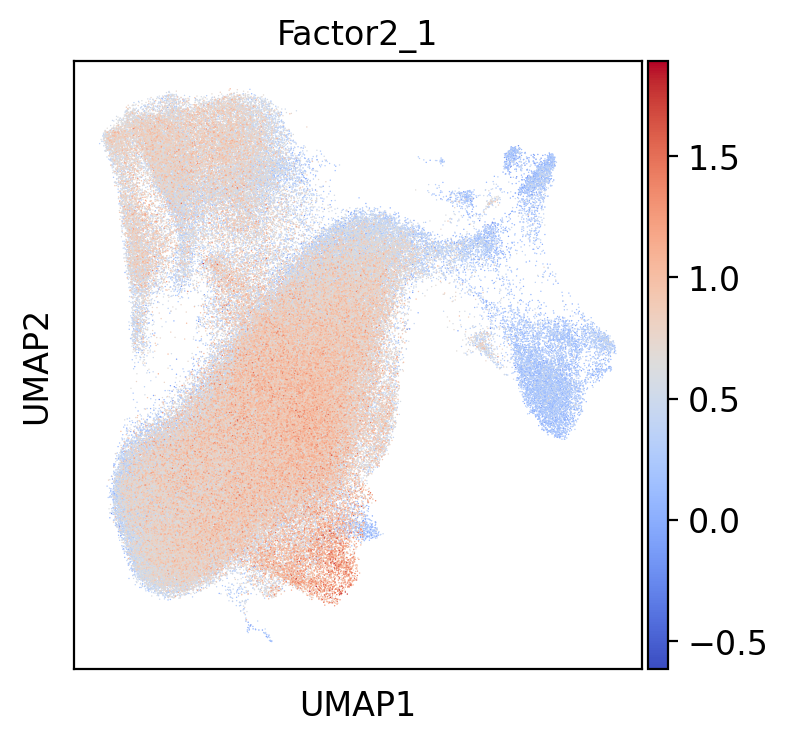

computing score 'Factor2_2'
    finished: added
    'Factor2_2', score of gene set (adata.obs).
    550 total control genes are used. (0:00:08)


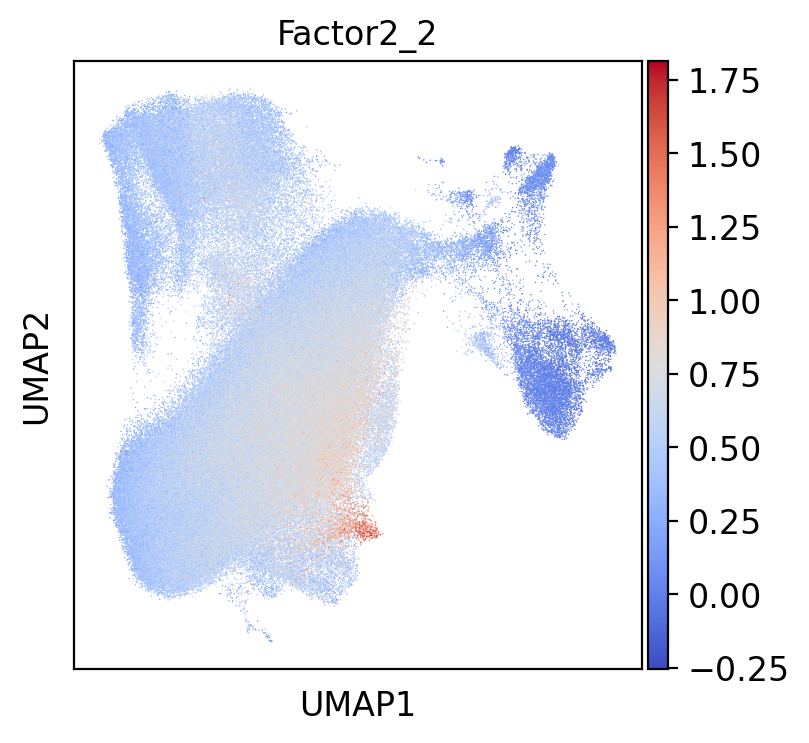

computing score 'Factor3_1'
    finished: added
    'Factor3_1', score of gene set (adata.obs).
    497 total control genes are used. (0:00:08)


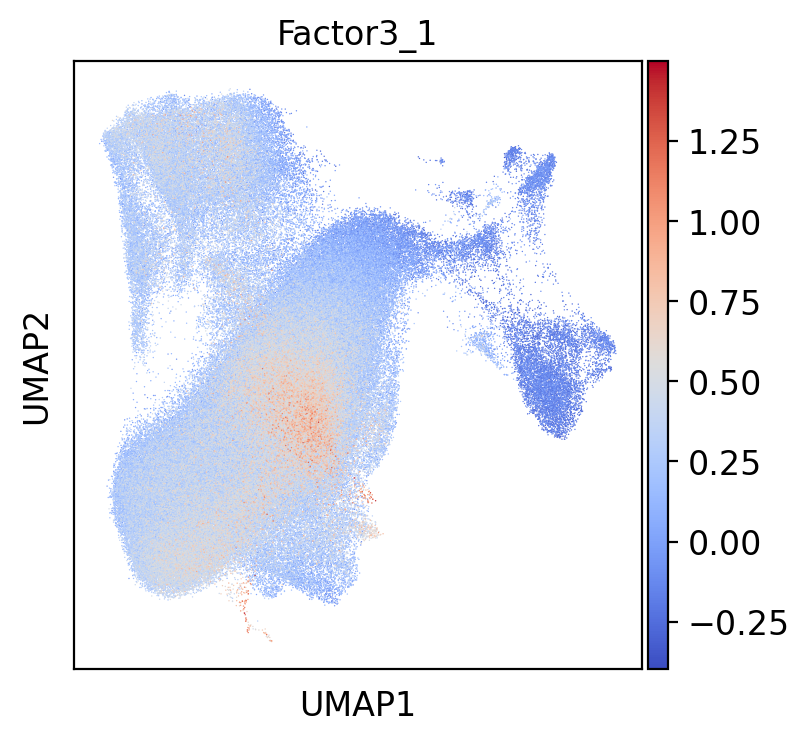

computing score 'Factor3_2'
    finished: added
    'Factor3_2', score of gene set (adata.obs).
    256 total control genes are used. (0:00:08)


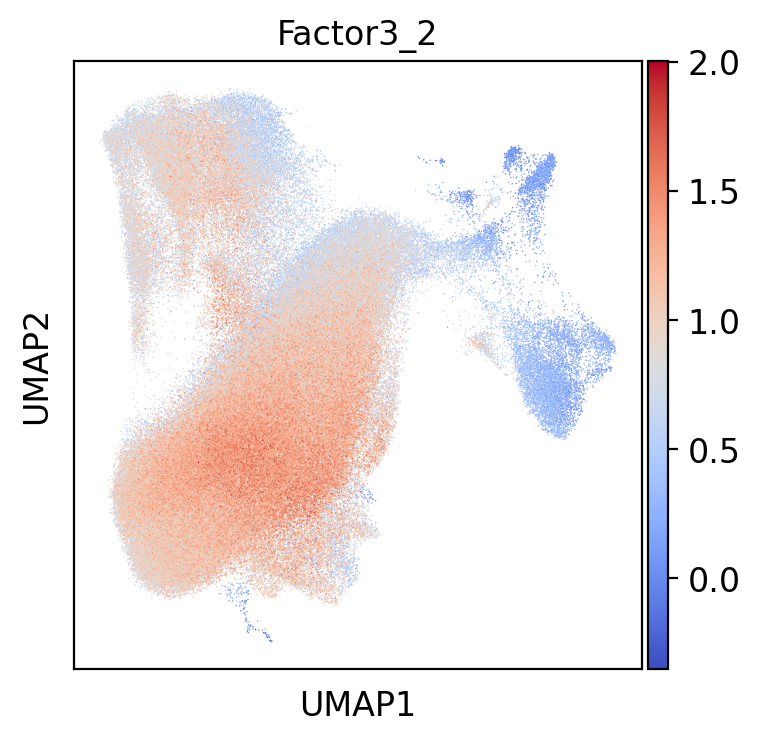

computing score 'Factor4_1'
    finished: added
    'Factor4_1', score of gene set (adata.obs).
    157 total control genes are used. (0:00:07)


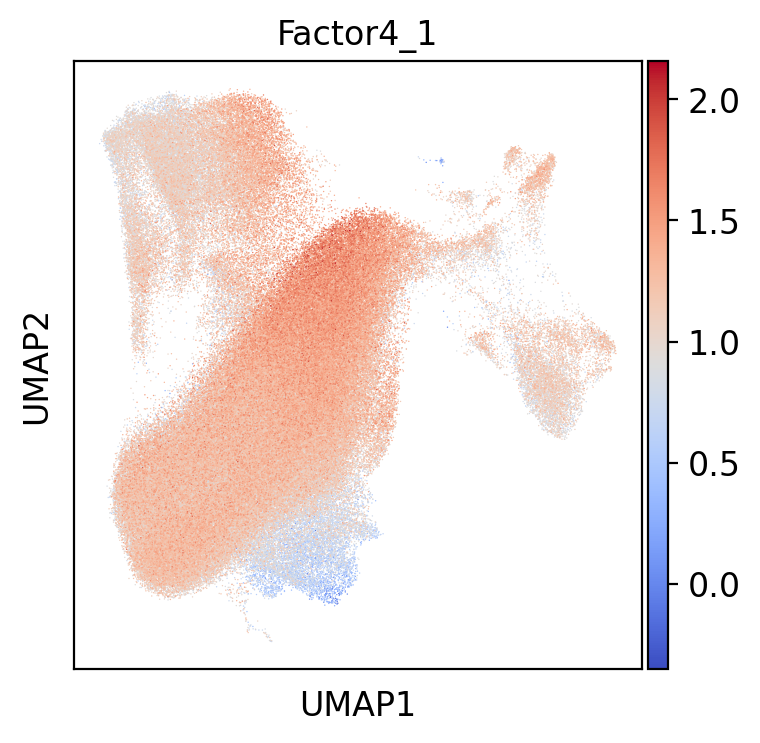

computing score 'Factor4_2'
    finished: added
    'Factor4_2', score of gene set (adata.obs).
    259 total control genes are used. (0:00:08)


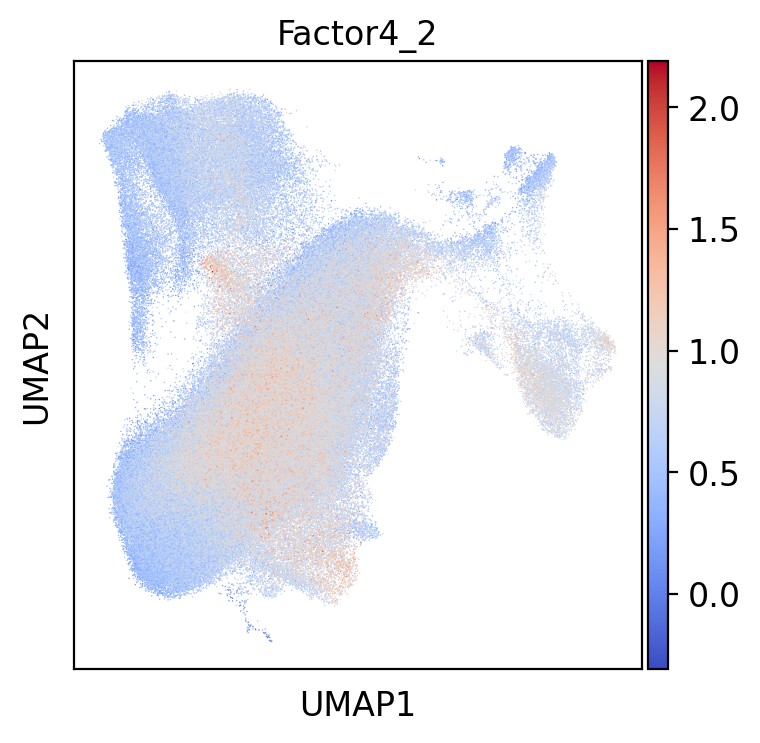

computing score 'Factor5_1'
    finished: added
    'Factor5_1', score of gene set (adata.obs).
    298 total control genes are used. (0:00:09)


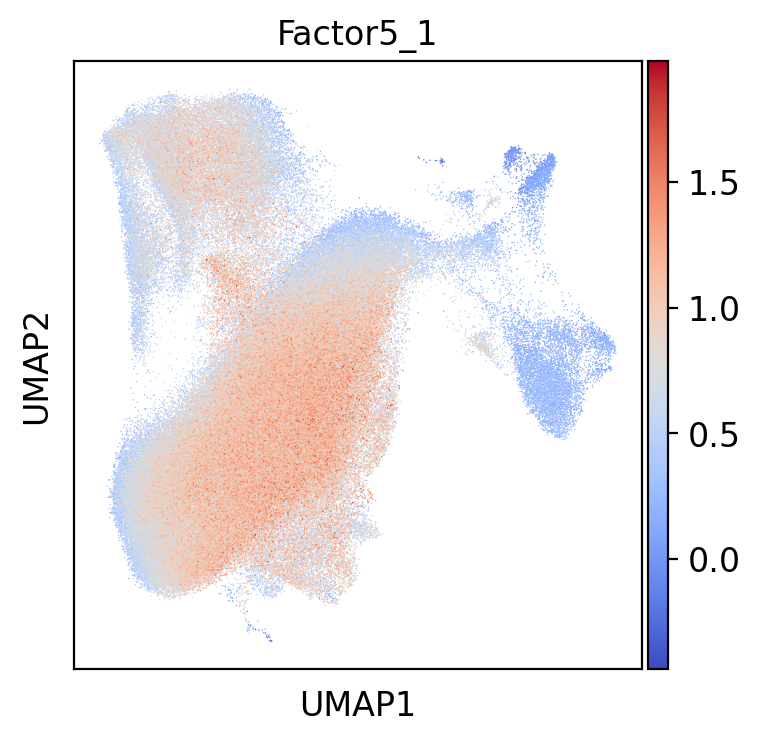

computing score 'Factor5_2'
    finished: added
    'Factor5_2', score of gene set (adata.obs).
    358 total control genes are used. (0:00:07)


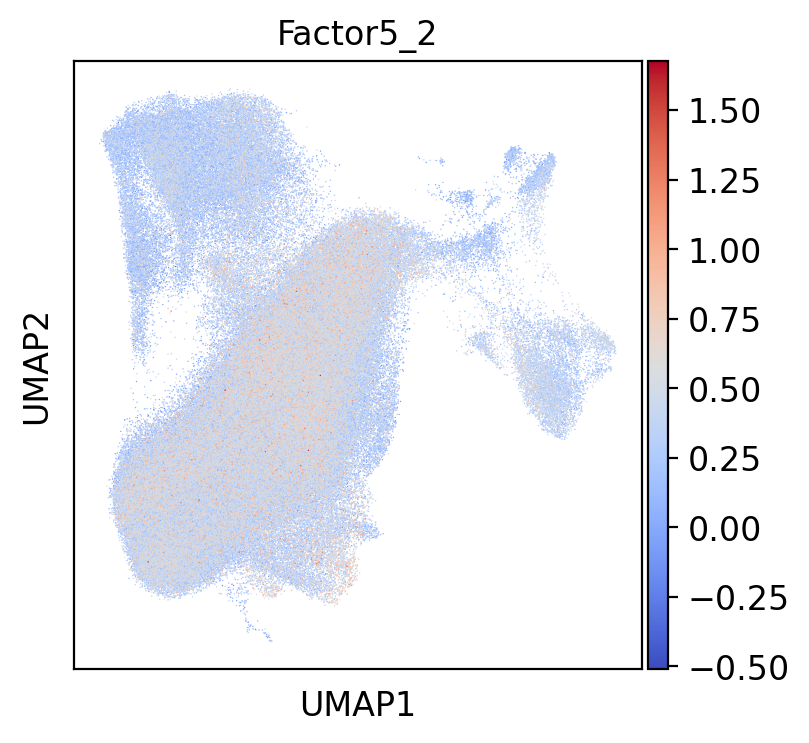

computing score 'Factor6_1'
    finished: added
    'Factor6_1', score of gene set (adata.obs).
    207 total control genes are used. (0:00:08)


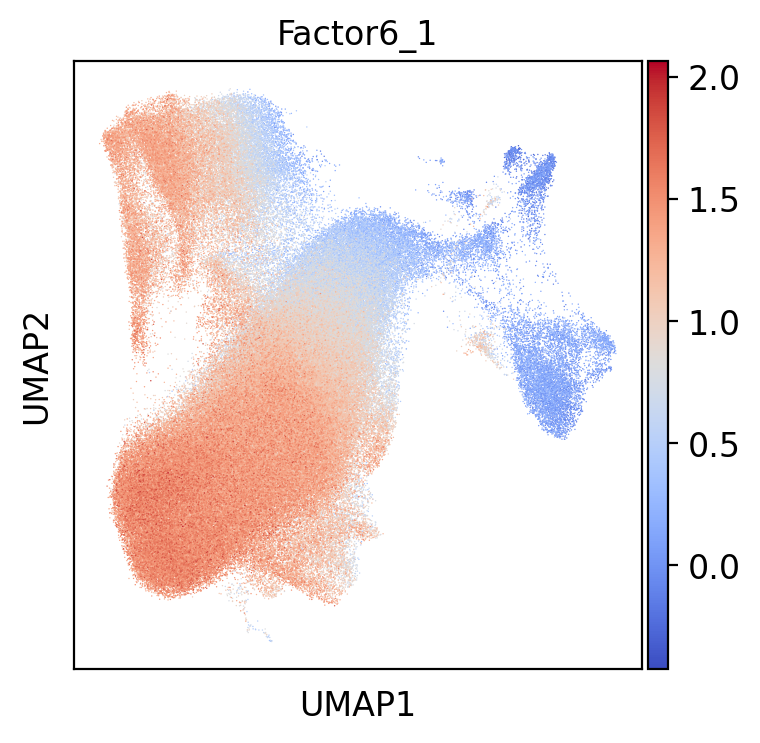

computing score 'Factor6_2'
    finished: added
    'Factor6_2', score of gene set (adata.obs).
    345 total control genes are used. (0:00:08)


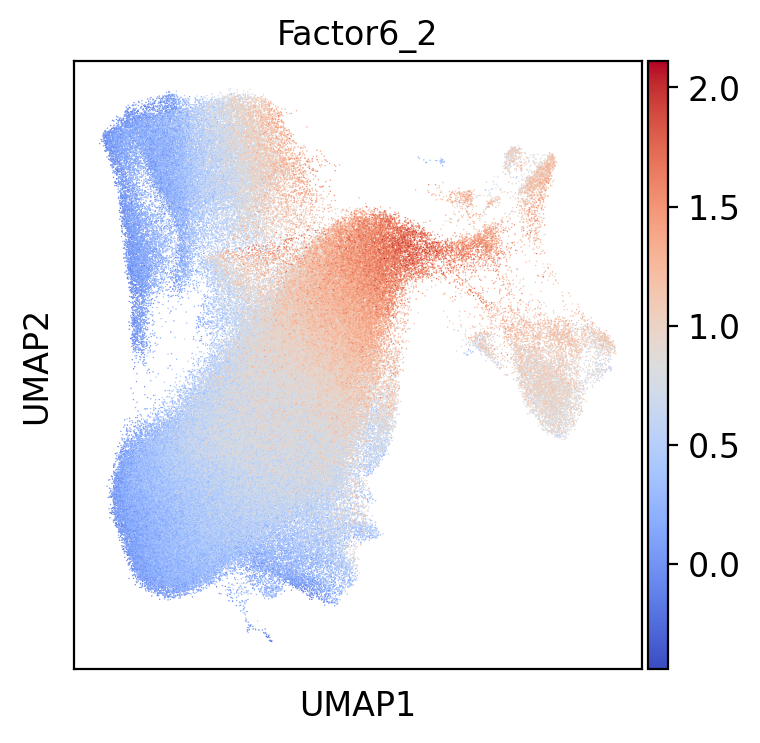

computing score 'Factor7_1'
    finished: added
    'Factor7_1', score of gene set (adata.obs).
    198 total control genes are used. (0:00:08)


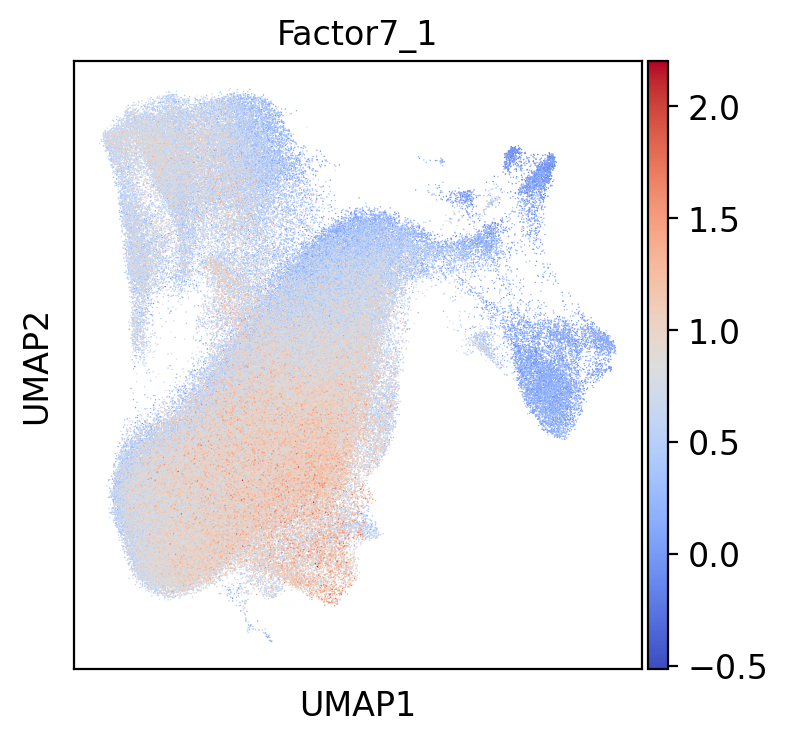

computing score 'Factor7_2'
    finished: added
    'Factor7_2', score of gene set (adata.obs).
    111 total control genes are used. (0:00:08)


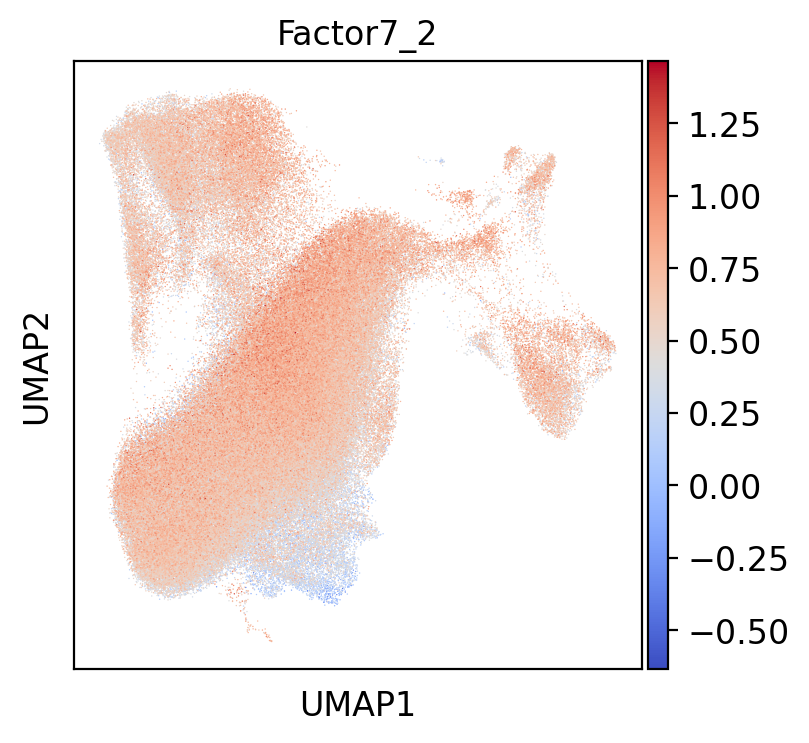

computing score 'Factor8_1'
    finished: added
    'Factor8_1', score of gene set (adata.obs).
    309 total control genes are used. (0:00:08)


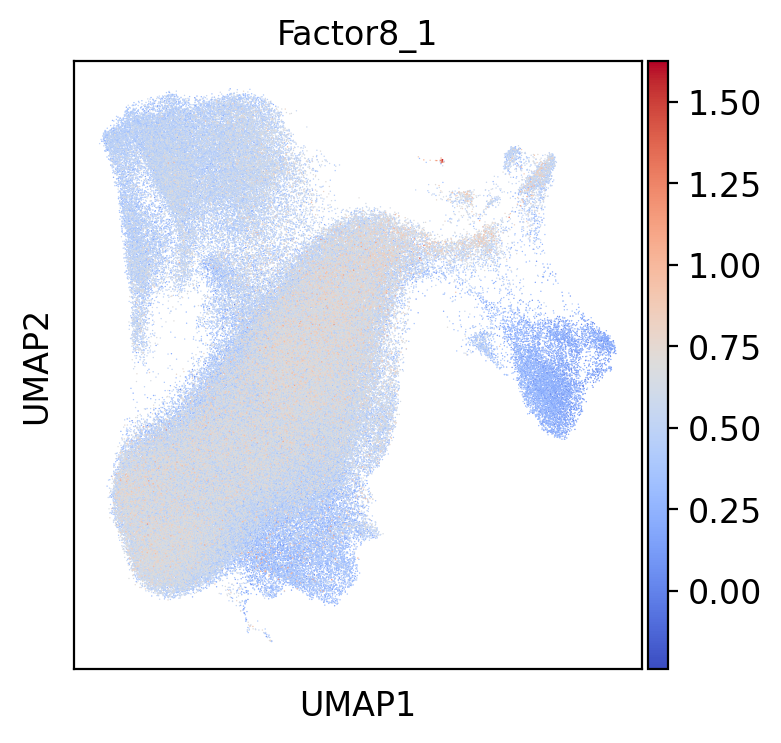

computing score 'Factor8_2'
    finished: added
    'Factor8_2', score of gene set (adata.obs).
    160 total control genes are used. (0:00:07)


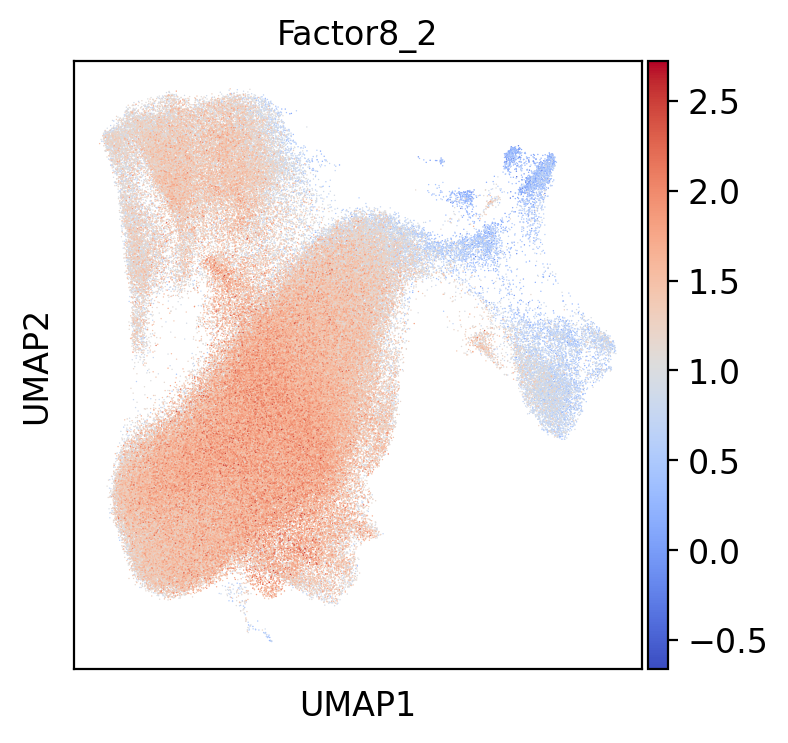

computing score 'Factor9_1'
    finished: added
    'Factor9_1', score of gene set (adata.obs).
    298 total control genes are used. (0:00:08)


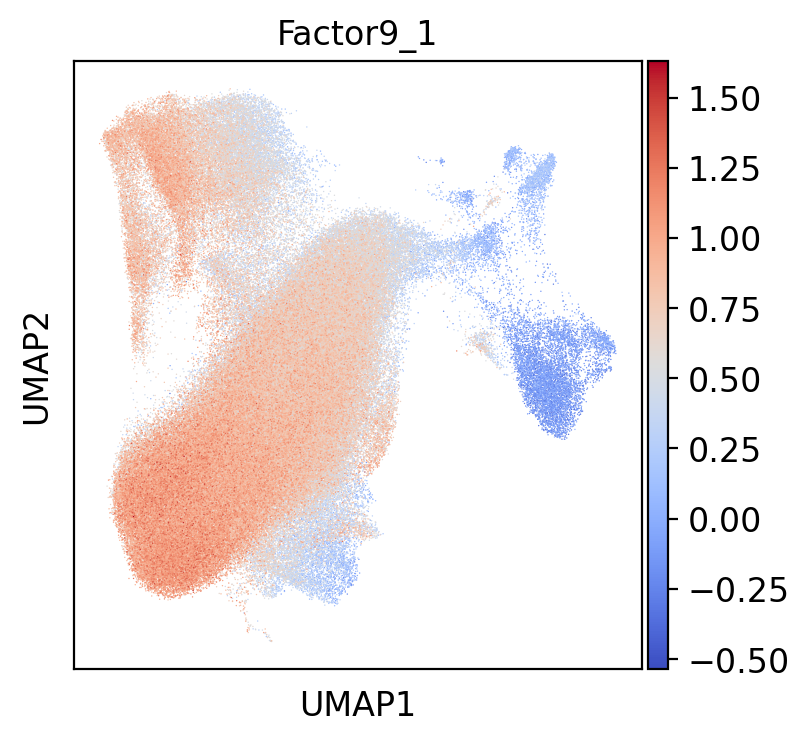

computing score 'Factor9_2'
    finished: added
    'Factor9_2', score of gene set (adata.obs).
    547 total control genes are used. (0:00:08)


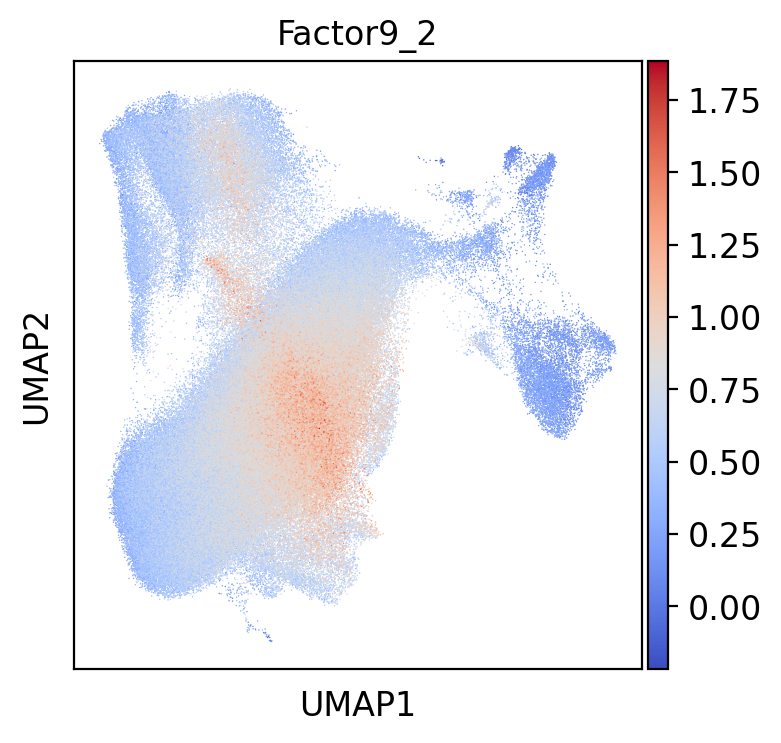

computing score 'Factor10_1'
    finished: added
    'Factor10_1', score of gene set (adata.obs).
    543 total control genes are used. (0:00:08)


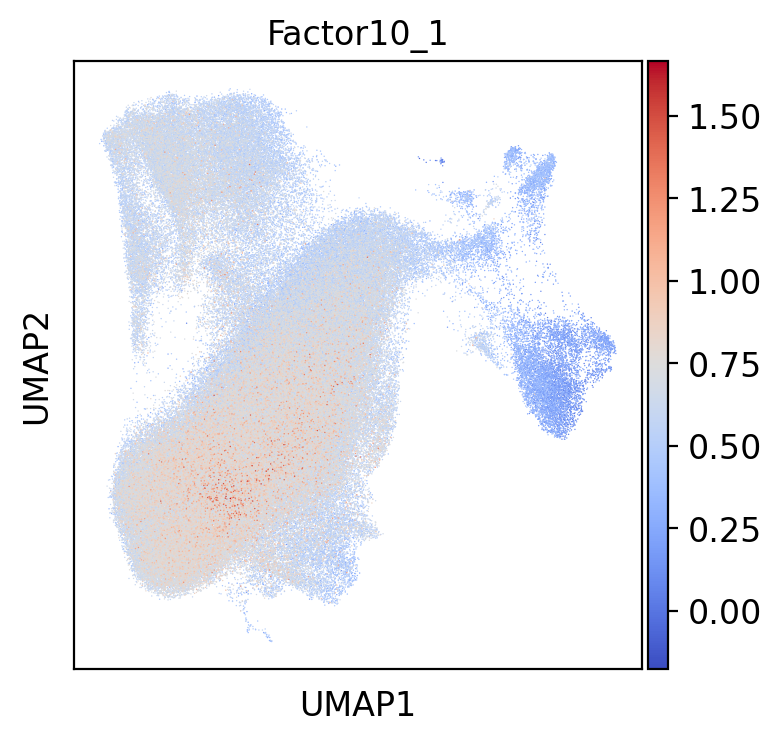

computing score 'Factor10_2'
    finished: added
    'Factor10_2', score of gene set (adata.obs).
    160 total control genes are used. (0:00:08)


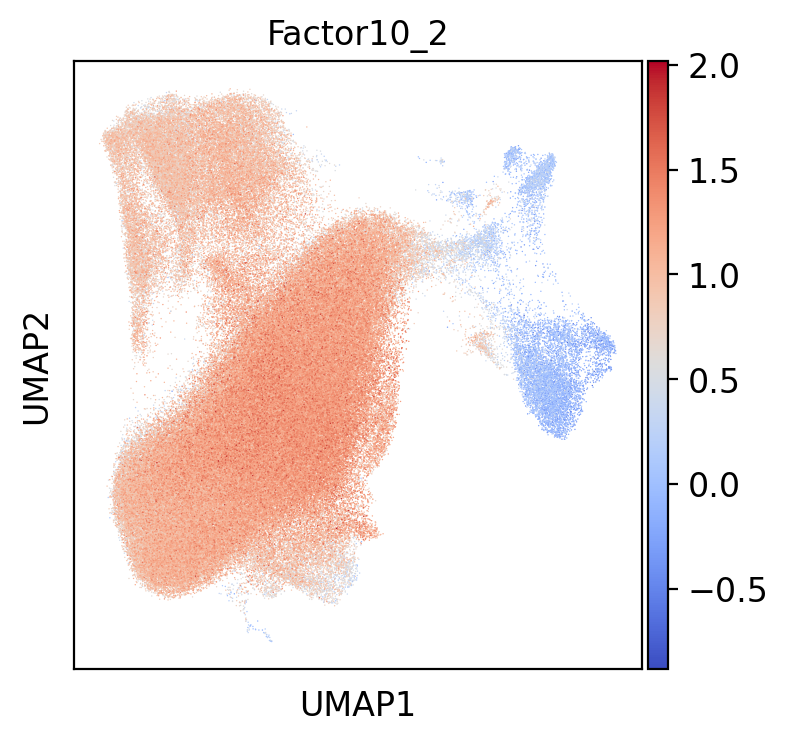

computing score 'Factor11_1'
    finished: added
    'Factor11_1', score of gene set (adata.obs).
    209 total control genes are used. (0:00:08)


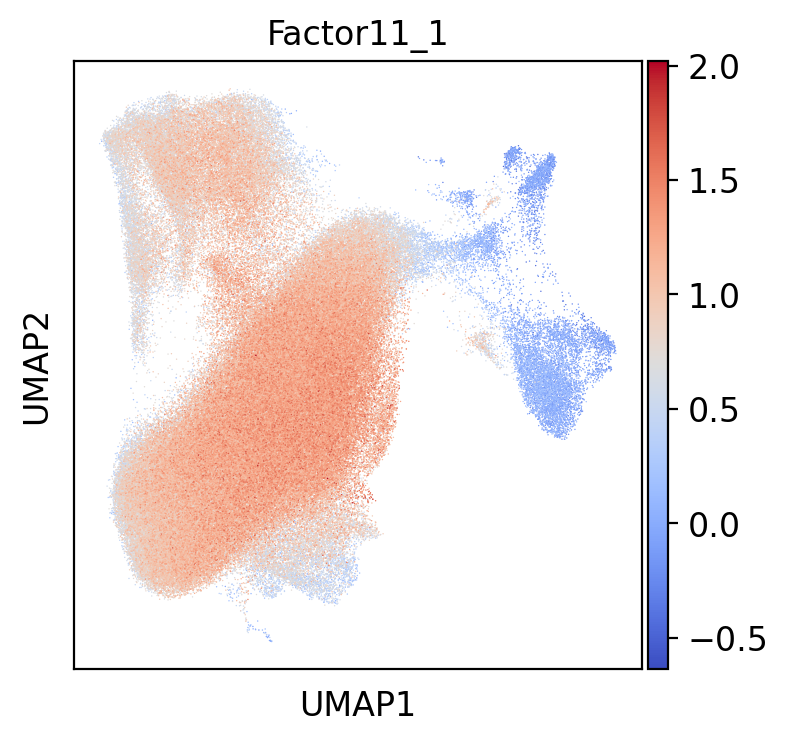

computing score 'Factor11_2'
    finished: added
    'Factor11_2', score of gene set (adata.obs).
    447 total control genes are used. (0:00:08)


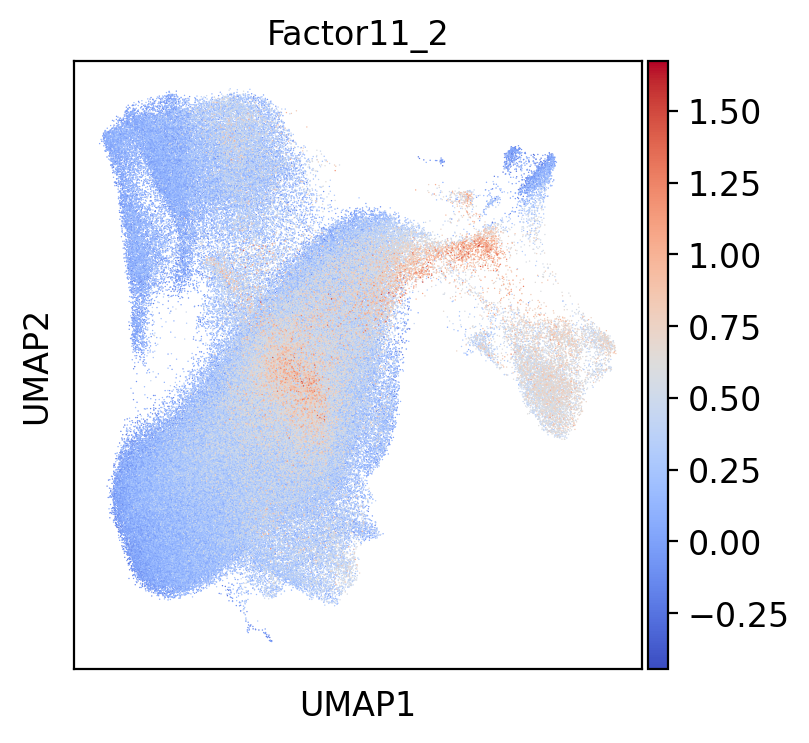

computing score 'Factor12_1'
    finished: added
    'Factor12_1', score of gene set (adata.obs).
    297 total control genes are used. (0:00:08)


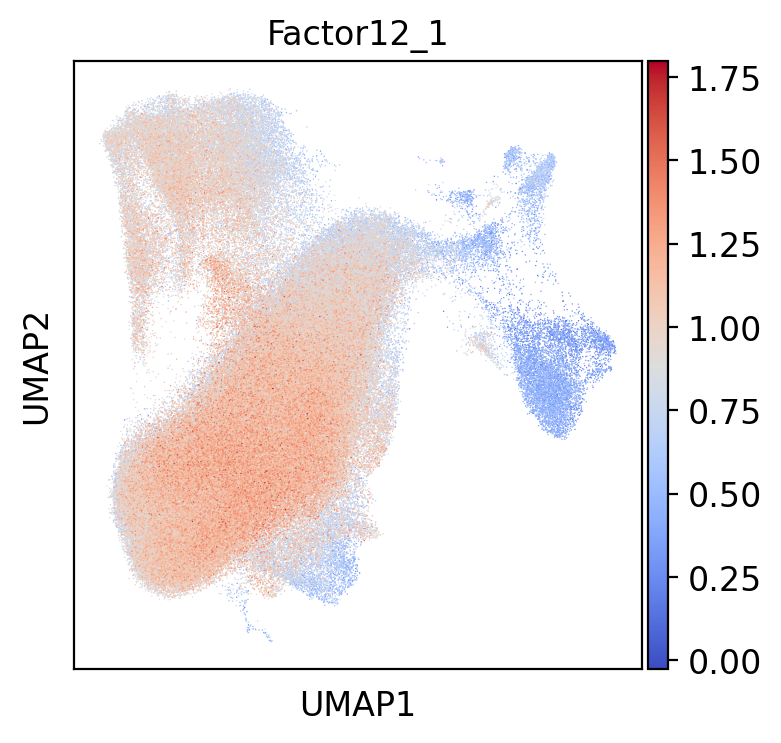

computing score 'Factor12_2'
    finished: added
    'Factor12_2', score of gene set (adata.obs).
    248 total control genes are used. (0:00:07)


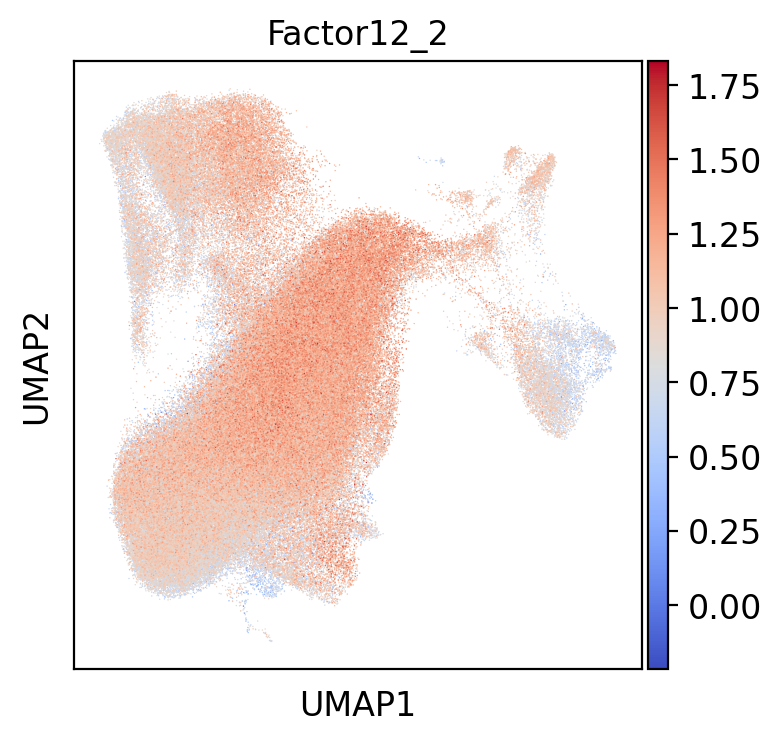

computing score 'Factor13_1'
    finished: added
    'Factor13_1', score of gene set (adata.obs).
    459 total control genes are used. (0:00:08)


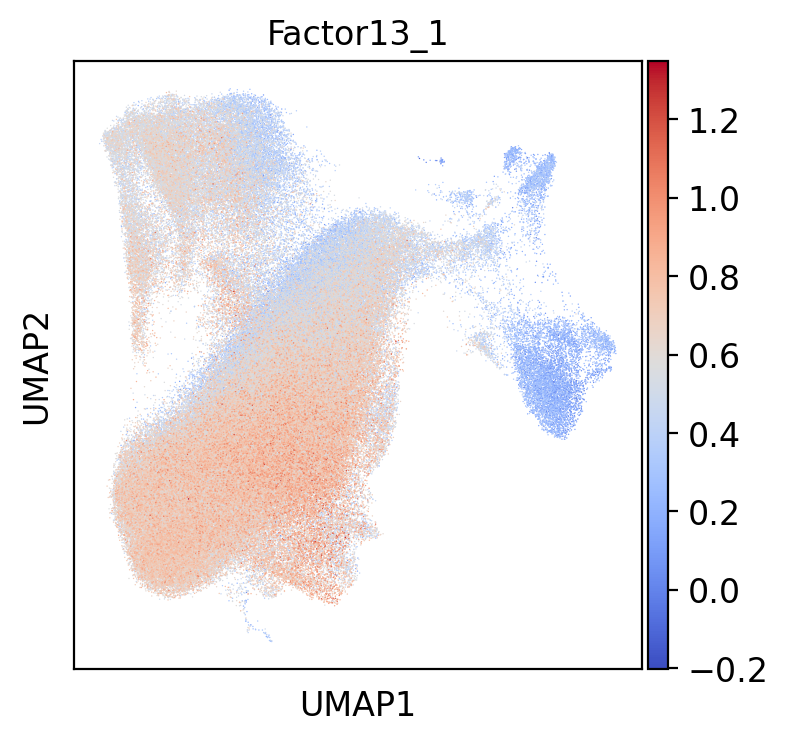

computing score 'Factor13_2'
    finished: added
    'Factor13_2', score of gene set (adata.obs).
    256 total control genes are used. (0:00:08)


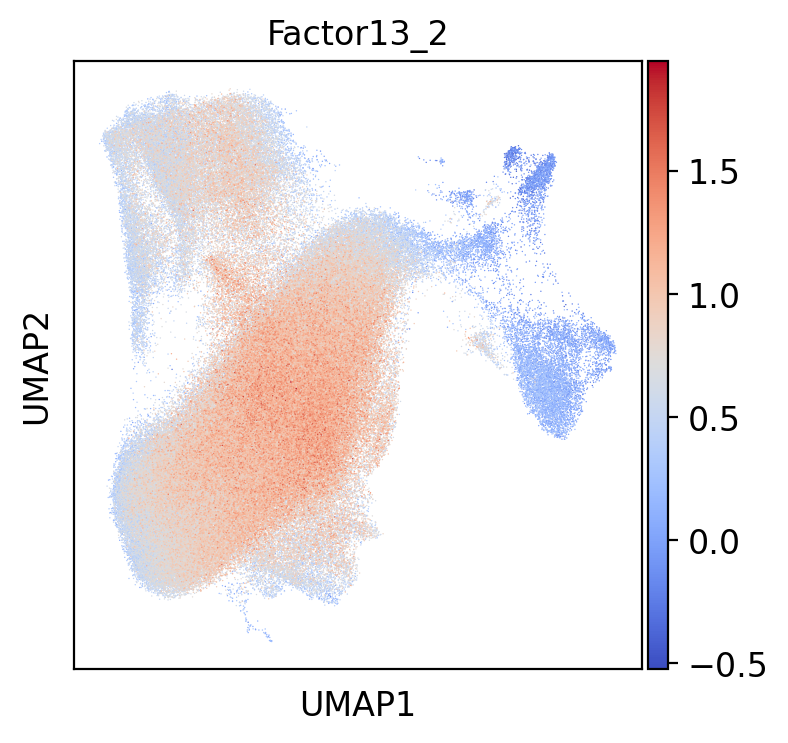

computing score 'Factor14_1'
    finished: added
    'Factor14_1', score of gene set (adata.obs).
    545 total control genes are used. (0:00:08)


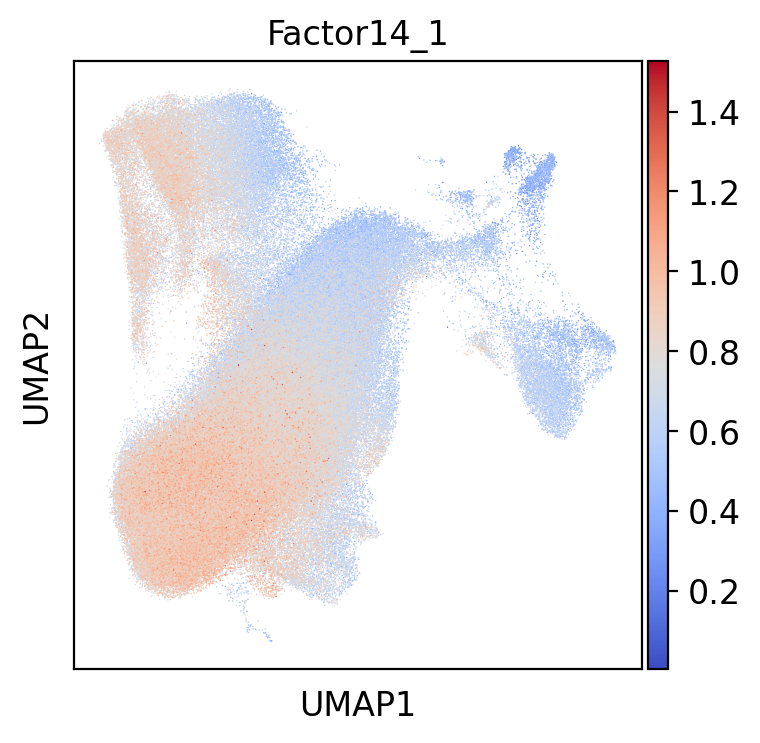

computing score 'Factor14_2'
    finished: added
    'Factor14_2', score of gene set (adata.obs).
    160 total control genes are used. (0:00:08)


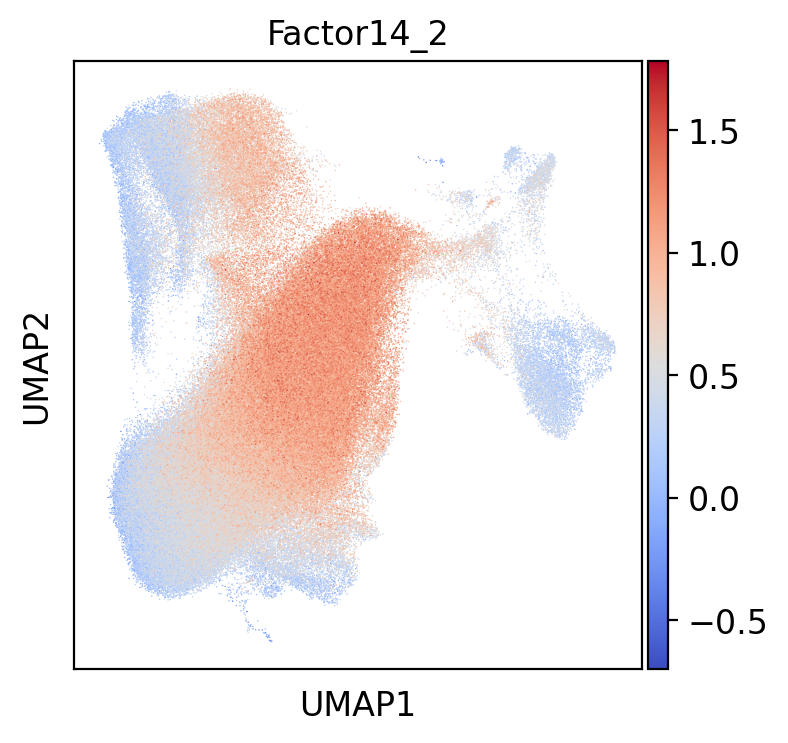

computing score 'Factor15_1'
    finished: added
    'Factor15_1', score of gene set (adata.obs).
    248 total control genes are used. (0:00:07)


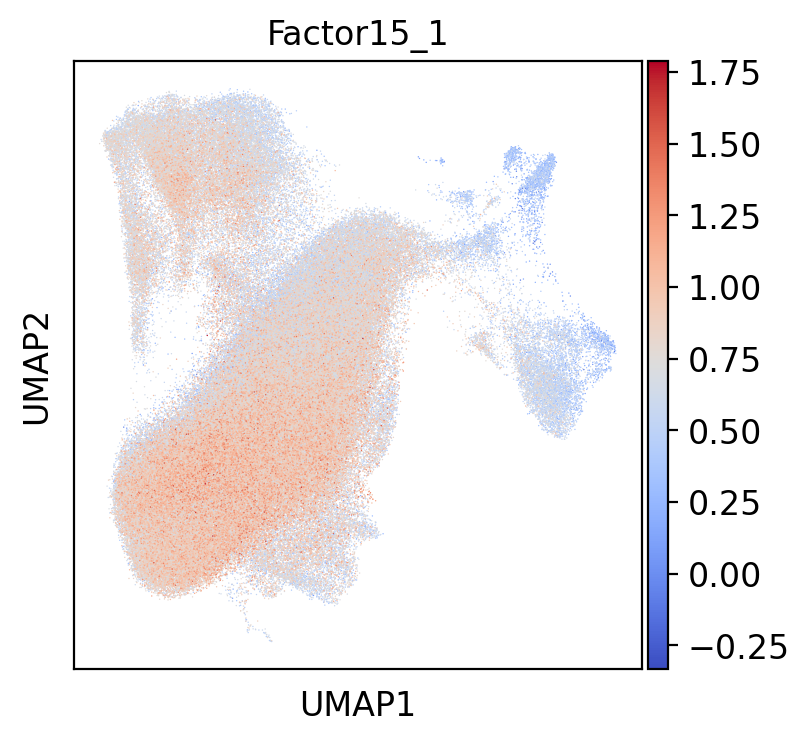

computing score 'Factor15_2'
    finished: added
    'Factor15_2', score of gene set (adata.obs).
    197 total control genes are used. (0:00:08)


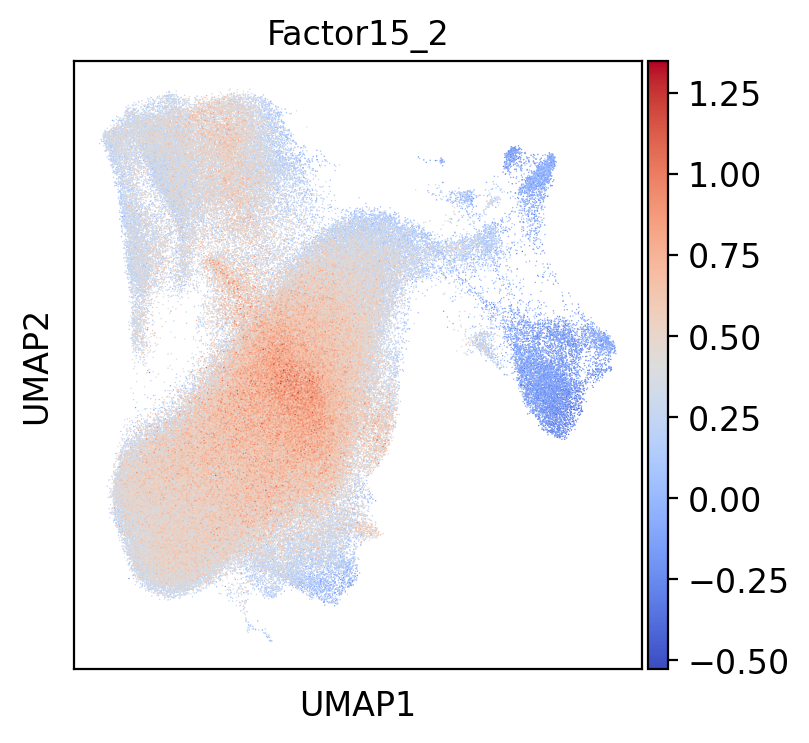

In [9]:
for i in [col for col in cGenes.columns if '_' in col]:
     myGeneList = cGenes.loc[:,i]
     myGeneList = [x.replace(".","-") for x in myGeneList]
     sc.tl.score_genes(adata=adataC, gene_list=myGeneList, score_name=i)
     sc.pl.umap(adataC, color=i, size=1, color_map="coolwarm",save=i+".pdf")
     #sc.pl.violin(adataC, i, groupby='leiden')

In [18]:
## Add covariates that should be corrected for
df = adataC.obs[["n_genes", "mt_frac", 'leiden']]

guideMatrix = df
guideMatrix.shape

(242938, 3)

In [7]:
# encoder = OneHotEncoder(handle_unknown='ignore')
# encoder_df = pd.DataFrame(encoder.fit_transform(adataC.obs[["leiden" ]]).toarray())
# newLeidenCols = ["Leiden" + str(x) for x in encoder_df.columns]
# encoder_df.columns  = newLeidenCols
# encoder_df.index = guideMatrix.index
# guideMatrix = guideMatrix.join(encoder_df)

In [21]:
guideMatrix["leiden"] = ["TC_"+str(x) for x in guideMatrix["leiden"]]

In [22]:
guideMatrix

,n_genes,mt_frac,leiden
AAACCCAGTGACACGA-1-E3-1,1414,0.082396,TC_0
AAACGAAAGCAGTCTT-1-E3-1,1656,0.059391,TC_0
AAACGAAAGCATTTGC-1-E3-1,1572,0.056792,TC_0
AAACGAATCTCAACCC-1-E3-1,1721,0.063300,TC_0
AAACGAATCTGGTGCG-1-E3-1,2158,0.070012,TC_4
...,...,...,...
TTTGGTTTCTGCTTTA-1-E4-24,2611,0.061330,TC_3
TTTGTTGAGTCATCCA-1-E4-24,2548,0.069108,TC_2
TTTGTTGAGTTAACAG-1-E4-24,1990,0.056980,TC_1
TTTGTTGCAGGACATG-1-E4-24,1015,0.040377,TC_0


In [23]:
expressionMatrix = pd.DataFrame(adataC.obs[[col for col in cGenes.columns if '_' in col]])
expressionMatrix.index = adataC.obs.index
expressionMatrix

,Factor1_1,Factor1_2,Factor2_1,Factor2_2,Factor3_1,Factor3_2,Factor4_1,Factor4_2,Factor5_1,Factor5_2,...,Factor11_1,Factor11_2,Factor12_1,Factor12_2,Factor13_1,Factor13_2,Factor14_1,Factor14_2,Factor15_1,Factor15_2
AAACCCAGTGACACGA-1-E3-1,0.764740,1.007104,0.039784,0.528229,0.113726,1.351956,0.736529,0.643757,0.564225,0.409196,...,0.535857,0.162970,1.246675,0.875661,0.576884,0.612861,0.790042,0.843966,1.201505,0.299777
AAACGAAAGCAGTCTT-1-E3-1,1.405177,1.481561,0.449580,0.500675,0.238402,1.042252,1.062511,0.823937,1.060803,0.207505,...,1.056874,0.470524,0.857921,1.154144,0.393966,0.872177,0.753790,0.909061,0.716329,0.571589
AAACGAAAGCATTTGC-1-E3-1,1.275278,1.005384,0.618601,0.669637,0.385288,1.035882,0.945195,0.646257,0.661955,0.308076,...,1.029039,0.173088,0.706729,1.188260,0.628075,0.818880,0.592152,1.025747,0.813743,0.340595
AAACGAATCTCAACCC-1-E3-1,1.416154,0.701629,0.361222,0.493743,0.286552,0.982188,1.010529,0.595448,0.430347,0.091950,...,0.940898,0.068570,1.110311,0.766566,0.658439,0.963596,0.661275,0.359644,1.032347,0.358407
AAACGAATCTGGTGCG-1-E3-1,1.284407,1.024083,0.790321,0.647194,0.553407,0.948978,0.852321,0.815889,1.271245,0.212067,...,1.191409,0.368802,0.682047,1.085205,0.569857,1.260607,0.837731,0.662279,1.105823,0.290157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTGCTTTA-1-E4-24,1.299954,0.728513,0.632834,0.439999,0.470215,0.686191,1.034457,0.382627,0.870436,0.187399,...,0.868372,-0.037939,0.721493,0.818200,0.396824,0.688679,0.736131,0.255848,0.473113,0.247372
TTTGTTGAGTCATCCA-1-E4-24,1.597547,0.974409,0.468147,0.663750,0.298530,0.873234,1.357884,0.341065,0.309441,0.227949,...,1.056487,0.009893,0.791657,1.269115,0.731558,0.632029,0.505116,0.861077,0.644116,0.177741
TTTGTTGAGTTAACAG-1-E4-24,1.286297,0.983736,0.630543,0.517706,0.336547,1.127185,1.141347,0.409893,0.734352,-0.094649,...,1.036048,-0.161652,1.011004,0.852757,0.638656,0.862580,0.948585,0.412201,0.902078,0.412940
TTTGTTGCAGGACATG-1-E4-24,1.522257,1.170607,0.143989,0.820827,0.013836,1.234192,1.101224,0.690339,0.503453,0.130829,...,0.971227,0.303425,0.857496,1.344046,0.638646,0.685093,0.809800,1.252069,0.664032,0.505302


In [24]:
selColumns = pd.Series(["n_genes", "mt_frac", "leiden"])
selColumns

0    n_genes
1    mt_frac
2     leiden
dtype: object

In [11]:
del adataC

In [25]:
allResp=[col for col in cGenes.columns if '_' in col]
allResp

['Factor1_1',
 'Factor1_2',
 'Factor2_1',
 'Factor2_2',
 'Factor3_1',
 'Factor3_2',
 'Factor4_1',
 'Factor4_2',
 'Factor5_1',
 'Factor5_2',
 'Factor6_1',
 'Factor6_2',
 'Factor7_1',
 'Factor7_2',
 'Factor8_1',
 'Factor8_2',
 'Factor9_1',
 'Factor9_2',
 'Factor10_1',
 'Factor10_2',
 'Factor11_1',
 'Factor11_2',
 'Factor12_1',
 'Factor12_2',
 'Factor13_1',
 'Factor13_2',
 'Factor14_1',
 'Factor14_2',
 'Factor15_1',
 'Factor15_2']

In [26]:
expressionMatrix

,Factor1_1,Factor1_2,Factor2_1,Factor2_2,Factor3_1,Factor3_2,Factor4_1,Factor4_2,Factor5_1,Factor5_2,...,Factor11_1,Factor11_2,Factor12_1,Factor12_2,Factor13_1,Factor13_2,Factor14_1,Factor14_2,Factor15_1,Factor15_2
AAACCCAGTGACACGA-1-E3-1,0.764740,1.007104,0.039784,0.528229,0.113726,1.351956,0.736529,0.643757,0.564225,0.409196,...,0.535857,0.162970,1.246675,0.875661,0.576884,0.612861,0.790042,0.843966,1.201505,0.299777
AAACGAAAGCAGTCTT-1-E3-1,1.405177,1.481561,0.449580,0.500675,0.238402,1.042252,1.062511,0.823937,1.060803,0.207505,...,1.056874,0.470524,0.857921,1.154144,0.393966,0.872177,0.753790,0.909061,0.716329,0.571589
AAACGAAAGCATTTGC-1-E3-1,1.275278,1.005384,0.618601,0.669637,0.385288,1.035882,0.945195,0.646257,0.661955,0.308076,...,1.029039,0.173088,0.706729,1.188260,0.628075,0.818880,0.592152,1.025747,0.813743,0.340595
AAACGAATCTCAACCC-1-E3-1,1.416154,0.701629,0.361222,0.493743,0.286552,0.982188,1.010529,0.595448,0.430347,0.091950,...,0.940898,0.068570,1.110311,0.766566,0.658439,0.963596,0.661275,0.359644,1.032347,0.358407
AAACGAATCTGGTGCG-1-E3-1,1.284407,1.024083,0.790321,0.647194,0.553407,0.948978,0.852321,0.815889,1.271245,0.212067,...,1.191409,0.368802,0.682047,1.085205,0.569857,1.260607,0.837731,0.662279,1.105823,0.290157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCTGCTTTA-1-E4-24,1.299954,0.728513,0.632834,0.439999,0.470215,0.686191,1.034457,0.382627,0.870436,0.187399,...,0.868372,-0.037939,0.721493,0.818200,0.396824,0.688679,0.736131,0.255848,0.473113,0.247372
TTTGTTGAGTCATCCA-1-E4-24,1.597547,0.974409,0.468147,0.663750,0.298530,0.873234,1.357884,0.341065,0.309441,0.227949,...,1.056487,0.009893,0.791657,1.269115,0.731558,0.632029,0.505116,0.861077,0.644116,0.177741
TTTGTTGAGTTAACAG-1-E4-24,1.286297,0.983736,0.630543,0.517706,0.336547,1.127185,1.141347,0.409893,0.734352,-0.094649,...,1.036048,-0.161652,1.011004,0.852757,0.638656,0.862580,0.948585,0.412201,0.902078,0.412940
TTTGTTGCAGGACATG-1-E4-24,1.522257,1.170607,0.143989,0.820827,0.013836,1.234192,1.101224,0.690339,0.503453,0.130829,...,0.971227,0.303425,0.857496,1.344046,0.638646,0.685093,0.809800,1.252069,0.664032,0.505302


In [27]:
%%R -i expressionMatrix,guideMatrix,selColumns,allResp  -w 8 -h 4 -u in
library("MASS")
library("broom")


coefDF = data.frame()

for(i in seq(1,ncol(expressionMatrix),1)){
      print(i)
         
      myformula = "y~n_genes+mt_frac+leiden" 

      tryCatch(
            expr = {
                   #print(myformula)
                   guideMatrix["y"] = expressionMatrix[,i]
                   myFit <- glm(formula(myformula), data = guideMatrix, family = gaussian())
                   myDF <- data.frame(tidy(myFit))
                   myDF[,"respGene"] = unlist(allResp)[i]
                   coefDF <- rbind(coefDF, myDF)
            },
            error = function(e){ 
                print(e)
            },
            finally = {
                # (Optional)
                # Do this at the end before quitting the tryCatch structure...
            }
      ) 

}



[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30


In [28]:
%%R

"%ni%" = Negate( "%in%" )

coefDF$FDR = p.adjust(coefDF$p.value)
coefDFSgn = coefDF[coefDF$FDR < 0.1,]
coefDFSgn = coefDFSgn[coefDFSgn$term %ni% c("(Intercept)", "mt_frac", "n_genes"),]
coefDFSgn

          term     estimate    std.error   statistic       p.value   respGene
4   leidenTC_1  0.015959802 0.0013247386   12.047510  2.043384e-33  Factor1_1
5   leidenTC_2  0.185060515 0.0013912579  133.016688  0.000000e+00  Factor1_1
6   leidenTC_3  0.070647338 0.0015887377   44.467590  0.000000e+00  Factor1_1
7   leidenTC_4 -0.027755627 0.0025219481  -11.005630  3.645492e-28  Factor1_1
8   leidenTC_5  0.850899019 0.0029182199  291.581525  0.000000e+00  Factor1_1
9   leidenTC_6  0.032065644 0.0032498485    9.866812  5.855781e-23  Factor1_1
10  leidenTC_7  0.036025847 0.0039454506    9.130984  6.837836e-20  Factor1_1
11  leidenTC_8  0.851654944 0.0040660507  209.455070  0.000000e+00  Factor1_1
12  leidenTC_9  0.312970196 0.0157492284   19.872097  8.338368e-88  Factor1_1
16  leidenTC_1 -0.083253915 0.0013975093  -59.573066  0.000000e+00  Factor1_2
17  leidenTC_2 -0.215098696 0.0014676826 -146.556685  0.000000e+00  Factor1_2
18  leidenTC_3 -0.197602221 0.0016760104 -117.900353  0.000000e+

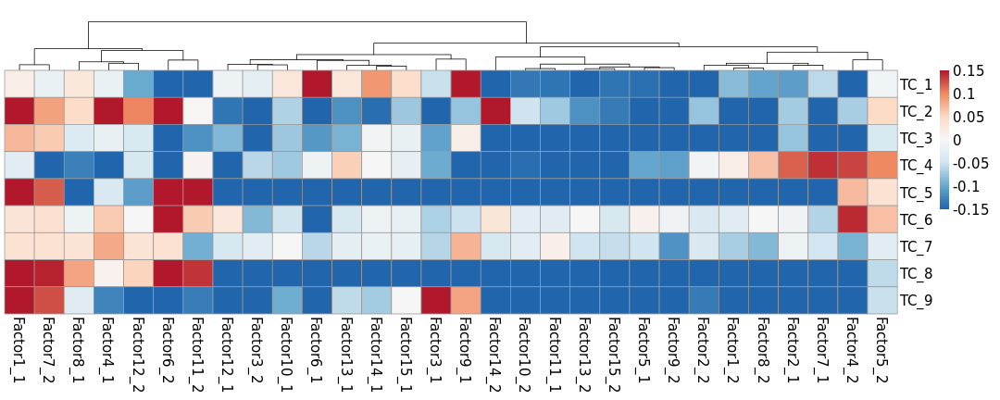

In [31]:
%%R  -w 15 -h 6 -u in

library("pheatmap")
library("RColorBrewer")
library(stringr)

myDat = data.frame(matrix(0, ncol=length(unique(coefDFSgn$respGene)),
                          nrow=length(unique(coefDFSgn$term))),
stringsAsFactors = FALSE)

colnames(myDat) = unique(coefDFSgn$respGene)
rownames(myDat) = unique(coefDFSgn$term)

for(j in 1:nrow(coefDFSgn)){
    myDat[coefDFSgn[j, "term"],coefDFSgn[j, "respGene"]] = coefDFSgn[j, "estimate"]

}

myDat[myDat > 0.15] = 0.15
myDat[myDat < -0.15] = -0.15

colnames(myDat) = sapply(colnames(myDat), function(x){str_replace(x, "genegroup","_")})
rownames(myDat) = sapply(rownames(myDat), function(x){str_replace(x, "leiden","")})

tryCatch(
    expr = {
           pheatmap(myDat, color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(200),
             clustering_method = "ward.D2", cluster_rows=FALSE,
                    treeheight_row = 0,fontsize = 15,
            main="")
    },
    error = function(e){ 
        print(e)
    },
    finally = {
        # (Optional)
        # Do this at the end before quitting the tryCatch structure...
    }
) 